In [4]:
import pandas as pd
import sqlite3

In [5]:
def Getdata(dataset ="ConsolidatedData"):
    con = sqlite3.connect("./data/location.s3db")
    alldata = pd.read_sql_query("SELECT BlightViolationNumber,Demolished from {} order by random()".format(dataset), con)
    return con, alldata.as_matrix(['BlightViolationNumber']), alldata.as_matrix(['Demolished']).reshape(len(alldata))

con, data, target = Getdata()
print( data.shape, target.shape)
con.close()

(9837, 1) (9837,)


In [3]:
import numpy as np
from sklearn import cross_validation
from sklearn import svm

In [4]:
datasets = ["ConsolidatedData","ConsolidatedData_2"]

def GetScore(clf, dataset="ConsolidatedData"):
    con, data, target = Getdata(dataset)
    scores = cross_validation.cross_val_score(clf, data, target, cv=5)
    con.close()
    return scores

def LazyGetScores(clf):
    for dataset in datasets:
        score = GetScore(clf,dataset)
        yield score

def GetScores(clf):
    return [score for score in LazyGetScores(clf)]


def GetPrediction(clf, dataset="ConsolidatedData"):
    con, data, target = Getdata(dataset)
    prediction = cross_validation.cross_val_predict(clf, data, target, cv=5)
    con.close()
    return target, prediction

def LazyGetPredictions(clf):
    for dataset in datasets:
        score = GetPrediction(clf,dataset)
        yield score

def GetPredictions(clf):
    return [score for score in LazyGetPredictions(clf)]



In [5]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, recall_score

def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(2)
    plt.xticks(tick_marks, [0,1], rotation=45)
    plt.yticks(tick_marks, [0,1])
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
def printpredictions(clf):
    predictions = GetPredictions(clf)
    for pred in predictions:   
        plt.figure()
        target, prev = pred
        conf = confusion_matrix(target, prev)
        print("accuracy {}".format(accuracy_score(target, prev)))
        print("recall {}".format(recall_score(target, prev)))
        print("f1 {}".format(f1_score(target, prev)))
        print(conf)
        plot_confusion_matrix(conf)
        print("")
        
%matplotlib inline

In [26]:
import numpy as np
from sklearn import cross_validation
from sklearn import svm

clf = svm.SVC(kernel='linear', C=1)
GetScores(clf)

[array([ 0.50050813,  0.51321138,  0.51347229,  0.50482969,  0.50330452]),
 array([ 0.58536585,  0.58079268,  0.58922217,  0.57295374,  0.60498221])]

In [6]:
from sklearn.tree import DecisionTreeClassifier as DecisionTreeClassifier
from sklearn import tree

clf =DecisionTreeClassifier()
GetScores(clf)
#clf.feature_importances_

[array([ 0.6554878 ,  0.66768293,  0.63650229,  0.65124555,  0.66344687]),
 array([ 0.62042683,  0.62398374,  0.60904931,  0.61718353,  0.60345704])]

In [7]:
clf =DecisionTreeClassifier()
con, data, target = Getdata()
clf.fit(data, target)
con.close()

accuracy 0.6538578835010674
recall 0.49431465784577217
f1 0.5840967387321363
[[4041  959]
 [2446 2391]]

accuracy 0.6145166209210126
recall 0.5402108745089932
f1 0.5795076513639388
[[3432 1568]
 [2224 2613]]



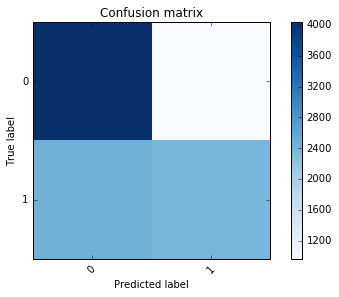

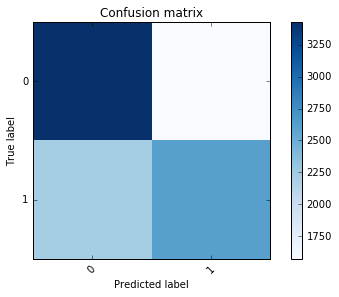

In [8]:
clf =  DecisionTreeClassifier()
printpredictions(clf)

In [88]:
def visualize_tree(clf, treename):
    """Create tree png using graphviz.

    Args
    ----
    tree -- scikit-learn DecsisionTree.
    feature_names -- list of feature names.
    """
    with open(treename+".dot", 'w') as f:
        tree.export_graphviz(clf, out_file=f)

    command = ["C:\Program Files (x86)\Graphviz2.38\bin\dot.exe", "-Tpng", treename+".dot", "-o", treename+".png"]
    try:
        subprocess.check_call(command)
    except:
        print("Could not run dot, ie graphviz, to "
             "produce visualization")
        
        

In [89]:
visualize_tree(clf, "./data/tree4")

Could not run dot, ie graphviz, to produce visualization


In [31]:
from sklearn.linear_model import LogisticRegression as LogisticRegression

clf = LogisticRegression()
GetScores(clf)

[array([ 0.55386179,  0.54115854,  0.53228266,  0.53787494,  0.5744789 ]),
 array([ 0.60111789,  0.60315041,  0.60701576,  0.60040671,  0.60650737])]

accuracy 0.5479312798617465
recall 0.6154641306594997
f1 0.5724449572156524
[[2413 2587]
 [1860 2977]]

accuracy 0.6036393209311782
recall 0.3845358693405003
f1 0.48825305158157234
[[4078  922]
 [2977 1860]]



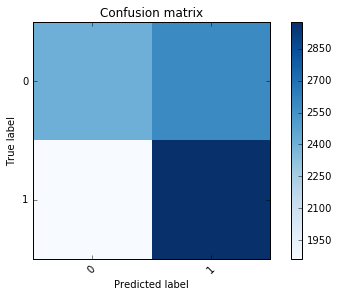

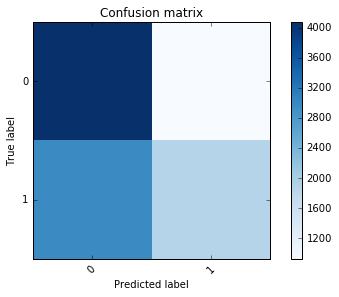

In [42]:
clf =  LogisticRegression()
printpredictions(clf)

In [33]:
from sklearn.naive_bayes import GaussianNB

clf =  GaussianNB()
GetScores(clf)


[array([ 0.65396341,  0.63109756,  0.63802745,  0.63701068,  0.56939502]),
 array([ 0.59502033,  0.57520325,  0.58261312,  0.57295374,  0.57092018])]

accuracy 0.6249872928738437
recall 0.5207773413272689
f1 0.5772888736106336
[[3629 1371]
 [2318 2519]]

accuracy 0.5793432957202399
recall 0.262559437667976
f1 0.3803533992213237
[[4429  571]
 [3567 1270]]



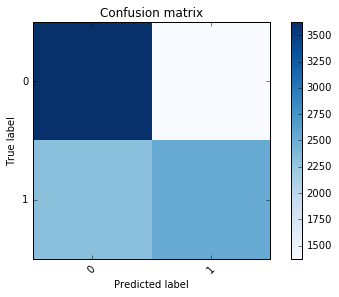

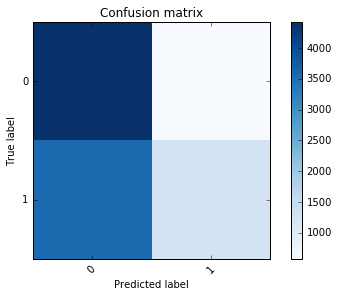

In [43]:
clf =  GaussianNB()
printpredictions(clf)

In [35]:
from sklearn.naive_bayes import BernoulliNB

clf =  BernoulliNB()
GetScores(clf)

[array([ 0.63770325,  0.65447154,  0.63802745,  0.64768683,  0.64768683]),
 array([ 0.61890244,  0.60823171,  0.61311642,  0.60650737,  0.62938485])]

accuracy 0.6451153807054997
recall 0.45834194748811247
f1 0.5594952681388012
[[4129  871]
 [2620 2217]]

accuracy 0.615228219985768
recall 0.5416580525118876
f1 0.5806094182825484
[[3432 1568]
 [2217 2620]]



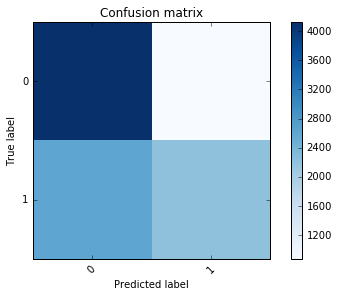

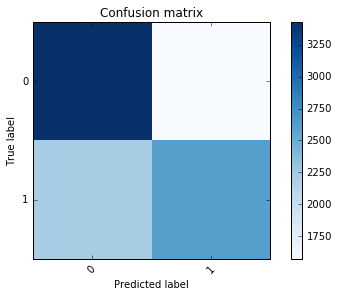

In [44]:
clf =  BernoulliNB()
printpredictions(clf)

accuracy 0.6086205143844668
recall 0.6516435807318586
f1 0.6208390781957849
[[2835 2165]
 [1685 3152]]

accuracy 0.4876486733760293
recall 0.7727930535455861
f1 0.5973154362416108
[[1059 3941]
 [1099 3738]]



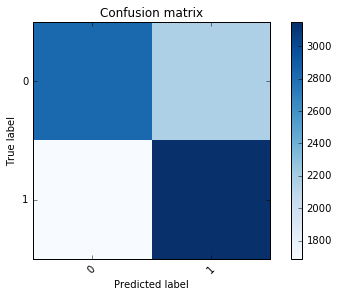

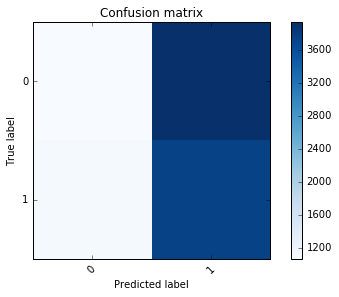

In [10]:
from sklearn.neighbors import KNeighborsClassifier

clf = KNeighborsClassifier(n_neighbors=3)
printpredictions(clf)

accuracy 0.6406424722984649
recall 0.5993384329129626
f1 0.621236472731169
[[3403 1597]
 [1938 2899]]

accuracy 0.5598251499440886
recall 0.22286541244573083
f1 0.33240826395312983
[[4429  571]
 [3759 1078]]



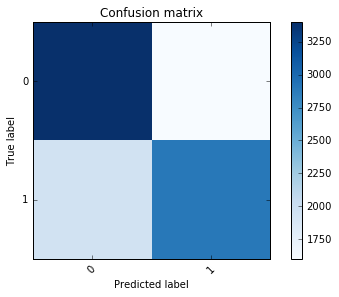

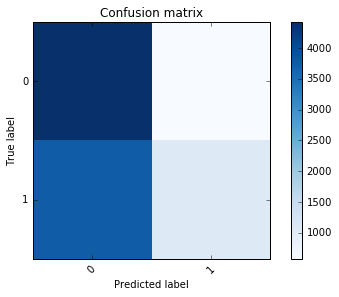

In [11]:
clf = KNeighborsClassifier(n_neighbors=2)
printpredictions(clf)

accuracy 0.65548439564908
recall 0.49369443870167457
f1 0.5849357011635027
[[4060  940]
 [2449 2388]]

accuracy 0.6148215919487648
recall 0.5406243539383916
f1 0.5798869054218871
[[3433 1567]
 [2222 2615]]



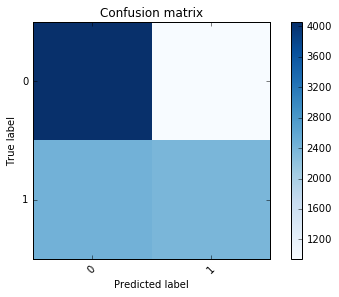

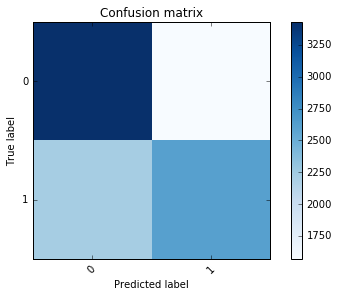

In [13]:
from sklearn.ensemble import GradientBoostingClassifier
clf = GradientBoostingClassifier()
printpredictions(clf)

accuracy 0.643488868557487
recall 0.4736406863758528
f1 0.5664482630733094
[[4039  961]
 [2546 2291]]

accuracy 0.6141099928840094
recall 0.5383502170767004
f1 0.5784095957352288
[[3437 1563]
 [2233 2604]]



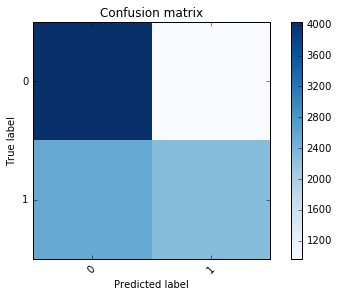

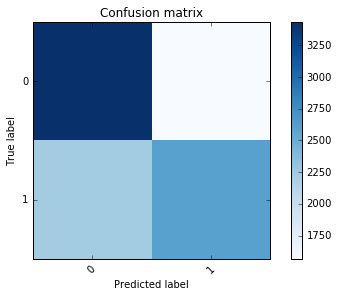

In [57]:
from sklearn.ensemble import RandomForestClassifier

cf = RandomForestClassifier()
printpredictions(clf)

In [6]:
import matplotlib.pyplot as plt

def Getdata(dataset ="ConsolidatedData"):
    con = sqlite3.connect("./data/location.s3db")
    alldata = pd.read_sql_query("SELECT BlightViolationNumber,Demolished from {} order by random()".format(dataset), con)
    return con, alldata

def plotmatplot(data):
    x = data.BlightViolationNumber
    y = data.Demolished
    plt.scatter(x, y, alpha=0.5)
    plt.show()

#.as_matrix(['BlightViolationNumber']), alldata.as_matrix(['Demolished']).reshape(len(alldata))

con, data = Getdata()
plotmatplot(data)
con.close()
#plt.hist(Demolition_Permits.InBB)

In [7]:
import numpy as np

from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [2]:
def plot(data):
    x = data.BlightViolationNumber
    y = data.Demolished
    TOOLS="resize,crosshair,pan,wheel_zoom,box_zoom,undo,redo,reset,tap,previewsave,box_select,poly_select,lasso_select"
    p = figure(tools=TOOLS)
    p.scatter(x, y, fill_alpha=0.6, line_color=None, radius= np.array([5 for i in range(0,len(x))]))
    show(p)

In [8]:
con, data = Getdata()
plot(data)
con.close()

In [159]:
from bokeh.charts import Histogram,  show

def hist(data):
    hist = Histogram(data, values='BlightViolationNumber', color='Demolished', title="BlightViolationNumber Demolished", legend='top_left')
    show(hist)

In [160]:
con, data = Getdata()
hist(data)
con.close()

In [161]:
con, data = Getdata("ConsolidatedData_2")
hist(data)
con.close()